# Visualizing Big Data with `Datashader`

![Datashader](https://datashader.org/_static/logo_horizontal.png)

Plotting huge datasets is not just about computation resources and time. Even if you could easily do it, there's a still a **fundamental problem in extracting meaningful insight from these visualizations**.  

Datashader is a graphics pipeline system for creating **meaningful representations of large datasets** quickly and flexibly. Datashader breaks the creation of images into a series of explicit steps that allow computations to be done on intermediate representations.

**This notebook was adapted from:**
[Offical Datashader Examples Repository](https://github.com/holoviz/datashader/tree/master/examples)

### Load NYC Taxi data

In [1]:
import pandas as pd
df = pd.read_csv('nyc_taxi.csv',usecols= \
                       ['pickup_x', 'pickup_y', 'dropoff_x','dropoff_y', 'passenger_count','tpep_pickup_datetime'])
df.tail()

,tpep_pickup_datetime,passenger_count,pickup_x,pickup_y,dropoff_x,dropoff_y
10679302,2015-01-10 19:01:44,2,-8.232298e+06,4.980860e+06,-8.232492e+06,4.979234e+06
10679303,2015-01-10 19:01:44,2,-8.235721e+06,4.972331e+06,-8.234857e+06,4.971131e+06
10679304,2015-01-10 19:01:44,1,-8.235341e+06,4.975470e+06,-8.234203e+06,4.981092e+06
10679305,2015-01-10 19:01:44,1,-8.237594e+06,4.973844e+06,-8.235618e+06,4.973722e+06
10679306,2015-01-10 19:01:45,1,-8.233229e+06,4.977946e+06,-8.234152e+06,4.977120e+06


As you can see, this file contains about 12 million pickup and dropoff locations, with passenger counts.

### Define a simple plot with Bokeh

I'll be using Bokeh together with Datashader to plot. <br>
If you don't know Bokeh, I've made a separate video tutorial for it: <br>
[![Bokeh](https://img.youtube.com/vi/aLERfzOTsfk/2.jpg)](https://www.youtube.com/watch?v=aLERfzOTsfk)

In [47]:
from bokeh.models import BoxZoomTool
from bokeh.plotting import figure, output_notebook, show

output_notebook()

# Define general parameters for the Bokeh plot
NYC = x_range, y_range = ((-8242000,-8210000), (4965000,4990000))

plot_width  = int(990)
plot_height = int(plot_width//1.2)

options = dict(line_color=None, fill_color='blue', size=5)

Loading BokehJS ...

In [48]:
# Reusable function to create simple Bokeh plots

def base_plot(tools='pan,wheel_zoom,reset', plot_width=plot_width, plot_height=plot_height, **plot_kwargs):
    p = figure(tools=tools, plot_width=plot_width, plot_height=plot_height,
        x_range=x_range, y_range=y_range, outline_line_color=None,
        min_border=0, min_border_left=0, min_border_right=0,
        min_border_top=0, min_border_bottom=0, **plot_kwargs)
    
    p.axis.visible = False
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    
    p.add_tools(BoxZoomTool(match_aspect=True))
    
    return p

### 1000-point Scatterplot: Undersampling

In [49]:
from bokeh.tile_providers import STAMEN_TERRAIN

samples = df.sample(n=1000)
p = base_plot()
p.add_tile(STAMEN_TERRAIN)
p.circle(x=samples['dropoff_x'], y=samples['dropoff_y'], **options)
show(p)

### 10,000-point Scatterplot: Overplotting

In [50]:
samples = df.sample(n=10000)
p = base_plot()
p.add_tile(STAMEN_TERRAIN)
p.circle(x=samples['dropoff_x'], y=samples['dropoff_y'], **options)
show(p)

### 100,000-point scatterplot: saturation

In [51]:
options = dict(line_color=None, fill_color='blue', size=1, alpha=0.1)
samples = df.sample(n=100000)
p = base_plot()
p.add_tile(STAMEN_TERRAIN)
p.circle(x=samples['dropoff_x'], y=samples['dropoff_y'], **options)
show(p)

### 10-million-point Datashaded Plots: Auto-ranging, but Limited Dynamic Range
We can make more meaningful visualizations with Datashader

![Datashader Process](https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcRUJZ5AEpSPzwT8WR5CCY6Et1aSVprC1X1ciGW-6bspv_yUFq-7)

The steps involved in datashading are:
1. create a Canvas object with the shape of the eventual plot (i.e. having one storage bin for collecting points, per final pixel)
2. aggregating all points into that set of bins, incrementally counting them
3. mapping the resulting counts into a visible color from a specified range to make an image

In [52]:
import datashader as ds
from datashader import transfer_functions as tf
from datashader.colors import Greys9
Greys9_r = list(reversed(Greys9))[:-2]

In [53]:
cvs = ds.Canvas(plot_width=plot_width, plot_height=plot_height, x_range=x_range, y_range=y_range)
agg = cvs.points(df, 'dropoff_x', 'dropoff_y',  ds.count('passenger_count'))
img = tf.shade(agg, cmap=["white", 'darkblue'], how='linear')

The resulting image is similar to the 100,000-point Bokeh plot above, but:
1. Makes use of all 12 million datapoints
2. Computed in only a tiny fraction of the time
3. Does not require any magic-number parameters like size and alpha
4. Automatically ensures that there is no saturation or overplotting:

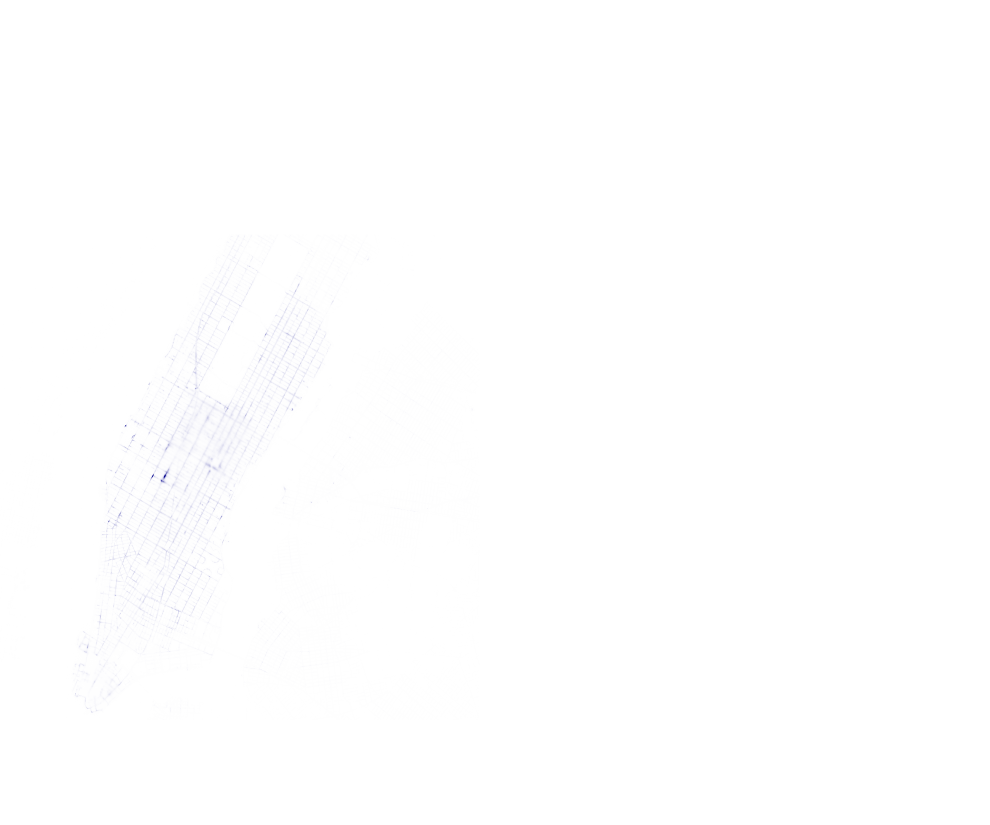

In [54]:
img

Many points are not visible in the above image, since the density differences between areas are not linear 

In [55]:
import numpy as np

# a histogram plotting function
def histogram(x, colors=None):
    hist,edges = np.histogram(x, bins=100)
    p = figure(y_axis_label="Pixels",
               tools='', height=130, outline_line_color=None,
               min_border=0, min_border_left=0, min_border_right=0,
               min_border_top=0, min_border_bottom=0)
    p.quad(top=hist[1:], bottom=0, left=edges[1:-1], right=edges[2:])
    print("min: {}, max: {}".format(np.min(x),np.max(x)))
    show(p)

In [56]:
histogram(agg.values)

min: 0, max: 11180


### 10-million-point Datashaded Plots: High Dynamic Range

For the typical case of data that is distributed nonlinearly over the available range, we can use nonlinear scaling to map the data range into the visible color range. For example:
1. First transforming the values via a log function will help flatten out this histogram and reveal much more of the structure of this data
2. Equalize the histogram of the data before building the image, making structure visible at every data level (and thus at all the geographic locations covered)

min: 0.8854349556167738, max: 1.0


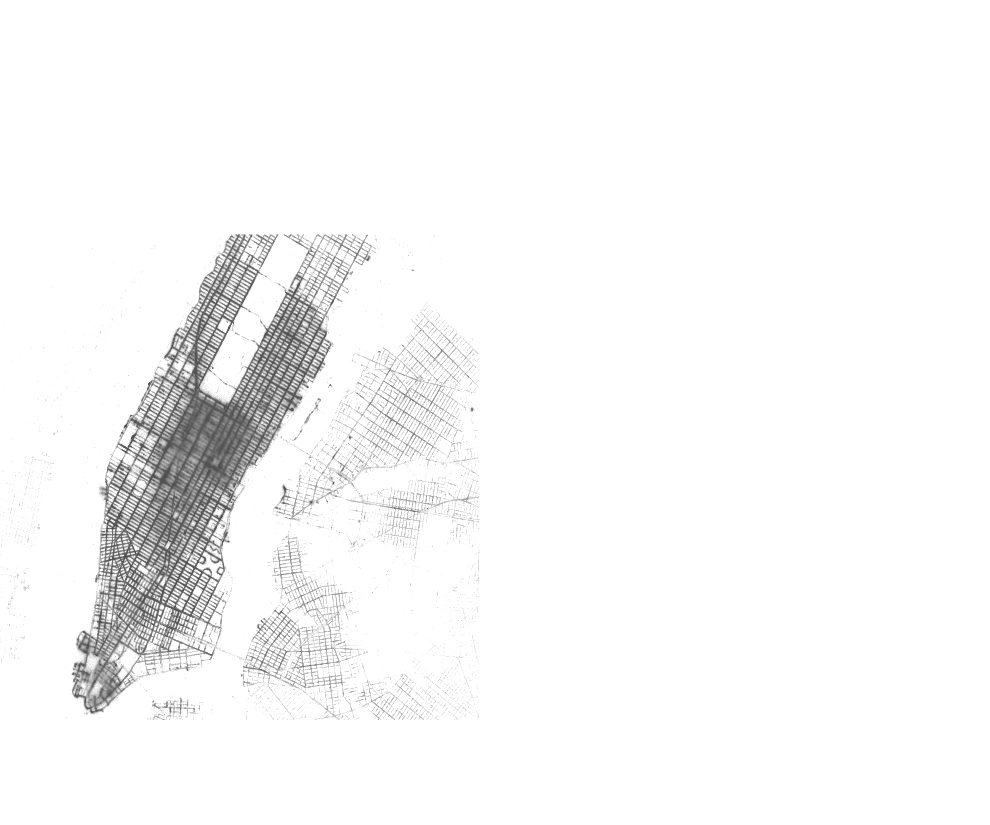

In [57]:
histogram(tf.eq_hist(agg.values))
    
tf.shade(agg, cmap=Greys9_r, how='eq_hist')

### 10-million-point Datashaded Plots: Interactive

The full power of datashading requires an interactive plot, because a big dataset will usually have structure at very many different levels.  Datashading allows auto-ranging and other automatic operations to be **recomputed dynamically for the specific selected viewport**, automatically revealing local structure that may not be visible from a global view. <br>
Here we'll embed the generated images into a Bokeh plot to support fully interactive zooming.

In [58]:
from datashader.bokeh_ext import InteractiveImage
from functools import partial
from datashader.utils import export_image
from datashader.colors import colormap_select, Hot, inferno

# cool trick (from the offical notebook to make function calls more elegant)
background = "black"
export = partial(export_image, export_path="export", background="black")
cm = partial(colormap_select, reverse=(background=="black"))

# this functions wraps the image creating process of datashader
def create_image(x_range, y_range, w=plot_width, h=plot_height):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cvs.points(df, 'dropoff_x', 'dropoff_y',  ds.count('passenger_count'))
    img = tf.shade(agg, cmap=Hot, how='eq_hist')
    return tf.dynspread(img, threshold=0.5, max_px=4)

In [59]:
# we can now use bokeh to interactivly create new datashader images at different scales 
p = base_plot(background_fill_color=background)
InteractiveImage(p, create_image)

In [28]:
# let's plot it again as an overlay to the map to get more insight
p = base_plot()
p.add_tile(STAMEN_TERRAIN)
InteractiveImage(p, create_image)

### Merge Multiple Plots
You can make your visualization even more informative by merging different datashader images and color them accordingly.
For instance, let's shade the most common places for pickups in a **red** and the most common places for drop-off in **blue**.

In [60]:
def merged_images(x_range, y_range, w=plot_width, h=plot_height, how='log'):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    picks = cvs.points(df, 'pickup_x',  'pickup_y',  ds.count('passenger_count'))
    drops = cvs.points(df, 'dropoff_x', 'dropoff_y', ds.count('passenger_count'))
    drops = drops.rename({'dropoff_x': 'x', 'dropoff_y': 'y'})
    picks = picks.rename({'pickup_x': 'x', 'pickup_y': 'y'})
    more_drops = tf.shade(drops.where(drops > picks), cmap=["darkblue", 'cornflowerblue'], how=how)
    more_picks = tf.shade(picks.where(picks > drops), cmap=["darkred", 'orangered'], how=how)
    img = tf.stack(more_picks, more_drops)
    return tf.dynspread(img, threshold=0.3, max_px=4)

In [61]:
p = base_plot(background_fill_color=background)
InteractiveImage(p, merged_images)